# 1. Data Preparation
This Notebook is used to prepare the Airplane Pictures for the Tensorflow Object Detection API \
Installation-Guide: https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html

In [64]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

from pathlib import Path

DATA_DIR = Path('../../data_raw')
img_list = list(DATA_DIR.glob('images/*.jpg'))
print("Number of images: {}".format(len(img_list)))
#print(*img_list, sep = "\n")

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Number of images: 103


In [65]:
import ast

# convert a string record into a valid python object
def f(x): 
    return ast.literal_eval(x.rstrip('\r\n'))

df = pd.read_csv(DATA_DIR / "annotations.csv", 
                converters={'geometry': f})
df = df.drop(columns=['id'])
df.head(3)

,image_id,geometry,class
0,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane
1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane
2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane


In [66]:
unique, counts = np.unique(df['class'], return_counts=True)
pd.DataFrame({'class': unique, 'count': counts})

,class,count
0,Airplane,3316
1,Truncated_airplane,109


## 1.1 Create Bounding Boxes for Airplanes
---

In [67]:
def getBounds(geometry):
    try: 
        arr = np.array(geometry).T
        xmin = np.min(arr[0])
        ymin = np.min(arr[1])
        xmax = np.max(arr[0])
        ymax = np.max(arr[1])
        return (xmin, ymin, xmax, ymax)
    except:
        return np.nan

def getWidth(bounds):
    try: 
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(xmax - xmin)
    except:
        return np.nan

def getHeight(bounds):
    try: 
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(ymax - ymin)
    except:
        return np.nan

# Create bounds, width and height
df.loc[:,'bounds'] = df.loc[:,'geometry'].apply(getBounds)
df.loc[:,'width'] = df.loc[:,'bounds'].apply(getWidth)
df.loc[:,'height'] = df.loc[:,'bounds'].apply(getHeight)

# Display head
df.head(3)

,image_id,geometry,class,bounds,width,height
0,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane,"(135, 522, 245, 600)",110,78
1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane,"(1025, 284, 1125, 384)",100,100
2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane,"(1058, 1503, 1130, 1568)",72,65


In [68]:
unique, counts = np.unique(df['image_id'], return_counts=True)
#per_image = np.asarray((unique, counts)).T
print("Minimum aircrafts per image: {}".format(np.min(counts)))
print("Maximum aircrafts per image: {}".format(np.max(counts)))

Minimum aircrafts per image: 5
Maximum aircrafts per image: 92


In [69]:
## find duplicate bounding boxes to delete

import math
from shapely.geometry import Polygon
index_list = []
for id in df["image_id"].unique():
    df_temp = df[df['image_id'] == id]
    for j, row in df_temp.iterrows():
        p1 = Polygon(df_temp['geometry'][j])
        for i, row in df_temp.iterrows():
            p2 = Polygon(df_temp['geometry'][i])
            if(p1.intersects(p2)):
                inter = p1.intersection(Polygon(df_temp['geometry'][i]))
                area = inter.area / p1.area 
                if(area > 0.75):
                    keep = []
                    if(p1.area < p2.area):
                       keep.append(j)

                    elif(p1.area > p2.area):
                       keep.append(i)
                    if(keep):
                        if keep[0] not in index_list:
                            index_list.append(keep[0])

In [70]:
len(index_list)

182

In [71]:
df = df.drop(df.index[index_list])
df.reset_index(inplace=True, drop=True)
df

,image_id,geometry,class,bounds,width,height
0,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane,"(135, 522, 245, 600)",110,78
1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane,"(1025, 284, 1125, 384)",100,100
2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane,"(1058, 1503, 1130, 1568)",72,65
3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane,"(813, 1518, 885, 1604)",72,86
4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane,"(594, 938, 657, 1012)",63,74
...,...,...,...,...,...,...
3238,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1809, 1790), (1869, 1790), (1869, 1848), (18...",Airplane,"(1809, 1790, 1869, 1848)",60,58
3239,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1760, 1878), (1828, 1878), (1828, 1936), (17...",Airplane,"(1760, 1878, 1828, 1936)",68,58
3240,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1736, 1946), (1794, 1946), (1794, 2000), (17...",Airplane,"(1736, 1946, 1794, 2000)",58,54
3241,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1059, 393), (1187, 393), (1187, 522), (1059,...",Airplane,"(1059, 393, 1187, 522)",128,129


In [72]:
df.to_csv('../sliced_images/quartered/annotaion/full_image_annotation.csv', sep=';', index=False)

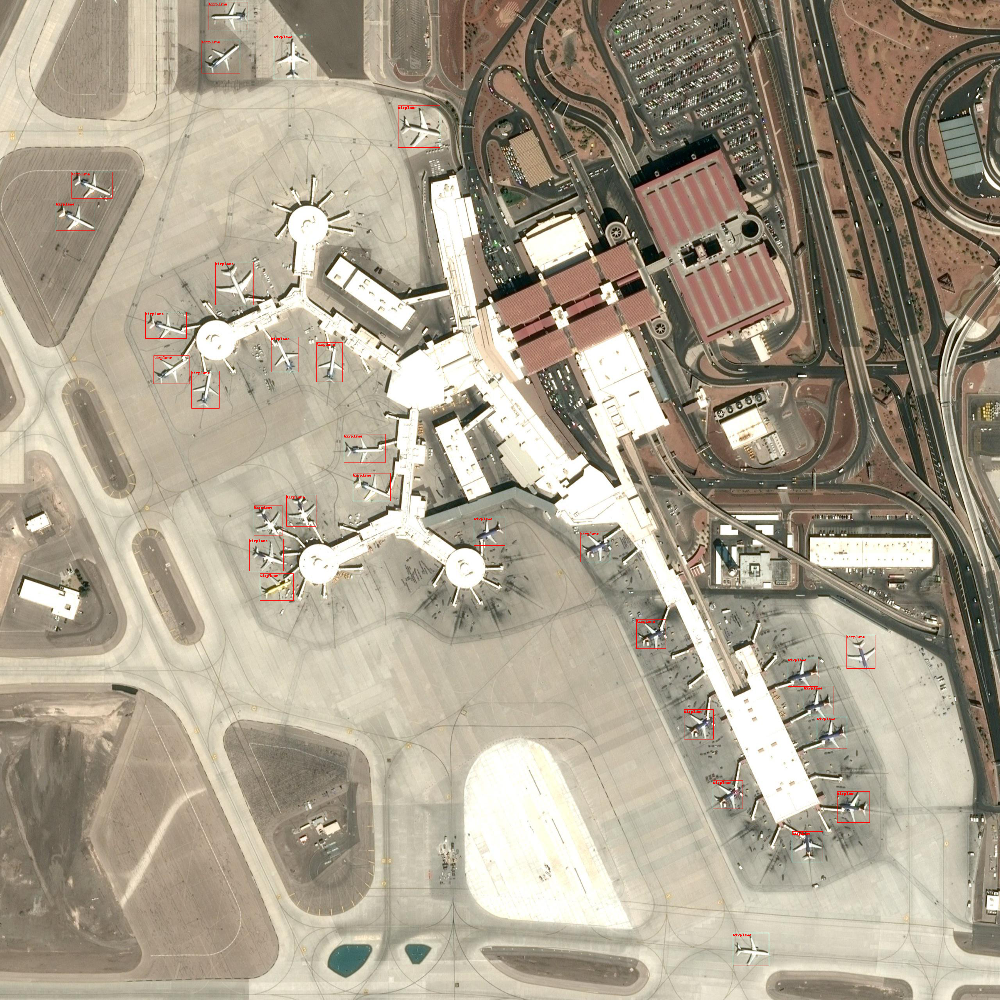

In [73]:
import os.path
import PIL.ImageDraw

pickone = '../../data_raw/images/074737f4-7f59-4729-be5d-67f6f1d34668.jpg'

img = PIL.Image.open(pickone)
draw = PIL.ImageDraw.Draw(img)

for k, row in df[df['image_id'] == os.path.basename(pickone)].iterrows():
    draw.polygon(row['geometry'], outline=(255,0,0))
    draw.text(row['geometry'][0], row['class'], fill=(255,0,0))
    
display(img)

## Slice the images in Quarter (1280x1280px)

In [74]:
import pandas as pd
import numpy as np
from PIL import Image
from shapely.geometry import Polygon, Point
from matplotlib import pyplot as plt
import glob
import math

In [75]:
# get all image names
imnames = glob.glob('../../data_raw/images/*.jpg')

#imnames = glob.glob('../../data_raw/images/074737f4-7f59-4729-be5d-67f6f1d34668.jpg')

# specify path for a new tiled dataset
newpath = '../sliced_images/quartered/true/'
falsepath = '../sliced_images/quartered/false/'

# specify slice width=height
slice_size = 1280

df_res = pd.DataFrame(columns=["image_id", "geometry", "class", "bounds","width", "height"])

# tile all images in a loop

for imname in imnames:
    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]

    labels = df[df['image_id'] == imname.split('/')[-1]]
    boxes = []
    # convert bounding boxes to shapely polygons. We need to invert Y and find polygon vertices from center points
    for index, row in labels.iterrows():
        
        x1, y1, x2, y2 = row["bounds"][0], row["bounds"][1], row["bounds"][2], row["bounds"][3]
        
       # x1 = row[1]['x1'] - row[1]['w']/2
       # y1 = (height - row[1]['y1']) - row[1]['h']/2
       # x2 = row[1]['x1'] + row[1]['w']/2
       # y2 = (height - row[1]['y1']) + row[1]['h']/2
        boxes.append((row['class'], Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))
    
    counter = 0
    print('Image:', imname)
    # create tiles and find intersection with bounding boxes for each tile
    for i in range((height // slice_size)):
        for j in range((width // slice_size)):
            x1 = (j*slice_size)
            y1 = (i*slice_size)
            x2 = ((j+1)*slice_size) - 1
            y2 = ((i+1)*slice_size) - 1
                        
            pol = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
            
            imsaved = False
            slice_labels = []
            slice_anno = []

            for box in boxes:
                if pol.intersects(box[1]):
                    inter = pol.intersection(box[1])   
                    if not imsaved:
                        sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                        sliced_im = Image.fromarray(sliced)
                        filename = imname.split('/')[-1]
                        slice_path = newpath + filename.replace('.jpg', f'_{i}_{j}.jpg')
                        
                        slice_labels_path = newpath + filename.replace('.jpg', f'_{i}_{j}.txt')
                        
                        print(slice_path)
                        sliced_im.save(slice_path)
                        imsaved = True                    
                    
                    # get the smallest polygon (with sides parallel to the coordinate axes) that contains the intersection
                    new_box = inter.envelope 
                    # get central point for the new bounding box 
                    centre = new_box.centroid
                    # get coordinates of polygon vertices
                    x, y = new_box.exterior.coords.xy
                    
                    
                    # if the bbox changed due to the image split, this means the airplane is truncated so the correct class will be set
                    objClass = str(box[0])
                    if(box[1].exterior.coords.xy != new_box.exterior.coords.xy):
                        objClass = "Truncated_airplane"
                        
                    # get bounding box width and height normalized to slice size
                    #new_width = (max(x) - min(x)) / slice_size
                    #new_height = (max(y) - min(y)) / slice_size
                    
                    
                    
                    # we have to normalize central x and invert y for yolo format
                    #new_x = (centre.coords.xy[0][0] - x1) / slice_size
                    #new_y = (y1 - centre.coords.xy[1][0]) / slice_size
                    
                    counter += 1

                    #slice_labels.append([box[0], new_x, new_y, new_width, new_height])
                    
                    
                    #if(min(x) > box[1][1][0]  )
                    
                    
                    
                    min_x, max_x, min_y, max_y = math.ceil(min(x) - (j*slice_size)), math.ceil(max(x)- (j*slice_size)), math.ceil(min(y)- (i*slice_size)), math.ceil(max(y)- (i*slice_size))
                    slice_width, slice_height = max_x - min_x, max_y - min_y 
                    geometry = [(min_x, min_y), (max_x, min_y), (max_x, max_y), (min_x, max_y)]
                    bounds= (min_x, min_y, max_x, max_y)
                    
                    slice_anno.append([imname.split('/')[-1].replace('.jpg', f'_{i}_{j}.jpg'), geometry, objClass, bounds, slice_width, slice_height])
            
                    
            
            # save txt with labels for the current tile
            if len(slice_anno) > 0:
                #slice_df = pd.DataFrame(slice_labels, columns=['class', 'x1', 'y1', 'w', 'h'])
                #slice_df.to_csv(slice_labels_path, sep=' ', index=False, header=False, float_format='%.6f')
                
                df_anno = pd.DataFrame(slice_anno, columns=["image_id", "geometry", "class", "bounds","width", "height"])
                df_res = df_res.append(df_anno)
            
            # if there are no bounding boxes intersect current tile, save this tile to a separate folder 
            if not imsaved:
                sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                sliced_im = Image.fromarray(sliced)
                filename = imname.split('/')[-1]
                slice_path = falsepath + filename.replace('.jpg', f'_{i}_{j}.jpg')                

                sliced_im.save(slice_path)
                print('Slice without boxes saved')
                imsaved = True
df = df_res.reset_index(drop=True) 
df.to_csv('../sliced_images/quartered/annotaion/annotation.csv', sep=';', index=False)

Image: ../../data_raw/images/90c365f8-18b6-4230-be74-cd856a1ba98f.jpg
../sliced_images/quartered/true/90c365f8-18b6-4230-be74-cd856a1ba98f_0_0.jpg
../sliced_images/quartered/true/90c365f8-18b6-4230-be74-cd856a1ba98f_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/90c365f8-18b6-4230-be74-cd856a1ba98f_1_1.jpg
Image: ../../data_raw/images/d3d2b706-9017-41f4-b57e-469038daa634.jpg
../sliced_images/quartered/true/d3d2b706-9017-41f4-b57e-469038daa634_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/d3d2b706-9017-41f4-b57e-469038daa634_0_1.jpg
../sliced_images/quartered/true/d3d2b706-9017-41f4-b57e-469038daa634_1_0.jpg
../sliced_images/quartered/true/d3d2b706-9017-41f4-b57e-469038daa634_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/e5416a97-a8ea-415f-928a-e75a5090cd46.jpg
../sliced_images/quartered/true/e5416a97-a8ea-415f-928a-e75a5090cd46_0_0.jpg
../sliced_images/quartered/true/e5416a97-a8ea-415f-928a-e75a5090cd46_0_1.jpg
../sliced_images/quartered/true/e5416a97-a8ea-415f-928a-e75a5090cd46_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
Image: ../../data_raw/images/fc1ab8ce-e531-46ed-b74b-0374cd58cf2a.jpg
../sliced_images/quartered/true/fc1ab8ce-e531-46ed-b74b-0374cd58cf2a_0_0.jpg
../sliced_images/quartered/true/fc1ab8ce-e531-46ed-b74b-0374cd58cf2a_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/fc1ab8ce-e531-46ed-b74b-0374cd58cf2a_1_0.jpg
../sliced_images/quartered/true/fc1ab8ce-e531-46ed-b74b-0374cd58cf2a_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/38ff8d64-3460-4f83-bf9c-383832aeba0d.jpg
../sliced_images/quartered/true/38ff8d64-3460-4f83-bf9c-383832aeba0d_0_0.jpg
../sliced_images/quartered/true/38ff8d64-3460-4f83-bf9c-383832aeba0d_0_1.jpg
../sliced_images/quartered/true/38ff8d64-3460-4f83-bf9c-383832aeba0d_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/38ff8d64-3460-4f83-bf9c-383832aeba0d_1_1.jpg
Image: ../../data_raw/images/0263270b-e3ee-41dc-aeef-43ff77e66d5b.jpg
../sliced_images/quartered/true/0263270b-e3ee-41dc-aeef-43ff77e66d5b_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/0263270b-e3ee-41dc-aeef-43ff77e66d5b_0_1.jpg
../sliced_images/quartered/true/0263270b-e3ee-41dc-aeef-43ff77e66d5b_1_0.jpg
../sliced_images/quartered/true/0263270b-e3ee-41dc-aeef-43ff77e66d5b_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/babb0ef2-ef2d-4cab-b3e2-230ae2418cdc.jpg
../sliced_images/quartered/true/babb0ef2-ef2d-4cab-b3e2-230ae2418cdc_0_0.jpg
../sliced_images/quartered/true/babb0ef2-ef2d-4cab-b3e2-230ae2418cdc_0_1.jpg
../sliced_images/quartered/true/babb0ef2-ef2d-4cab-b3e2-230ae2418cdc_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/babb0ef2-ef2d-4cab-b3e2-230ae2418cdc_1_1.jpg
Image: ../../data_raw/images/eeb3f271-15f5-4977-a921-f4636efc6434.jpg
../sliced_images/quartered/true/eeb3f271-15f5-4977-a921-f4636efc6434_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/eeb3f271-15f5-4977-a921-f4636efc6434_0_1.jpg
../sliced_images/quartered/true/eeb3f271-15f5-4977-a921-f4636efc6434_1_0.jpg
../sliced_images/quartered/true/eeb3f271-15f5-4977-a921-f4636efc6434_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/4fdabd34-a2fd-4f0a-bb48-01fe043f1499.jpg
../sliced_images/quartered/true/4fdabd34-a2fd-4f0a-bb48-01fe043f1499_0_0.jpg
../sliced_images/quartered/true/4fdabd34-a2fd-4f0a-bb48-01fe043f1499_0_1.jpg
../sliced_images/quartered/true/4fdabd34-a2fd-4f0a-bb48-01fe043f1499_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/4fdabd34-a2fd-4f0a-bb48-01fe043f1499_1_1.jpg
Image: ../../data_raw/images/9089631b-b1c0-4df8-b3f4-061c98149a94.jpg
../sliced_images/quartered/true/9089631b-b1c0-4df8-b3f4-061c98149a94_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/9089631b-b1c0-4df8-b3f4-061c98149a94_0_1.jpg
../sliced_images/quartered/true/9089631b-b1c0-4df8-b3f4-061c98149a94_1_0.jpg
../sliced_images/quartered/true/9089631b-b1c0-4df8-b3f4-061c98149a94_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/a40b7aed-8db8-449d-b0e4-3debfa04281a.jpg
../sliced_images/quartered/true/a40b7aed-8db8-449d-b0e4-3debfa04281a_0_0.jpg
../sliced_images/quartered/true/a40b7aed-8db8-449d-b0e4-3debfa04281a_0_1.jpg
../sliced_images/quartered/true/a40b7aed-8db8-449d-b0e4-3debfa04281a_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/a40b7aed-8db8-449d-b0e4-3debfa04281a_1_1.jpg
Image: ../../data_raw/images/7c2da441-819f-4ddd-8293-f4be5213d69e.jpg
../sliced_images/quartered/true/7c2da441-819f-4ddd-8293-f4be5213d69e_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/7c2da441-819f-4ddd-8293-f4be5213d69e_0_1.jpg
../sliced_images/quartered/true/7c2da441-819f-4ddd-8293-f4be5213d69e_1_0.jpg
../sliced_images/quartered/true/7c2da441-819f-4ddd-8293-f4be5213d69e_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/576827bc-a94a-4611-8820-f3d56e969151.jpg
../sliced_images/quartered/true/576827bc-a94a-4611-8820-f3d56e969151_0_0.jpg
../sliced_images/quartered/true/576827bc-a94a-4611-8820-f3d56e969151_0_1.jpg
../sliced_images/quartered/true/576827bc-a94a-4611-8820-f3d56e969151_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/576827bc-a94a-4611-8820-f3d56e969151_1_1.jpg
Image: ../../data_raw/images/11928d1c-44c7-4d3d-b593-9cdfd5f6f367.jpg
../sliced_images/quartered/true/11928d1c-44c7-4d3d-b593-9cdfd5f6f367_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/11928d1c-44c7-4d3d-b593-9cdfd5f6f367_1_0.jpg
../sliced_images/quartered/true/11928d1c-44c7-4d3d-b593-9cdfd5f6f367_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/ecfe7982-05e5-435f-824b-e24b6846316e.jpg
../sliced_images/quartered/true/ecfe7982-05e5-435f-824b-e24b6846316e_0_0.jpg
../sliced_images/quartered/true/ecfe7982-05e5-435f-824b-e24b6846316e_0_1.jpg
../sliced_images/quartered/true/ecfe7982-05e5-435f-824b-e24b6846316e_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/ecfe7982-05e5-435f-824b-e24b6846316e_1_1.jpg
Image: ../../data_raw/images/cbd51501-ed0f-411c-b472-df4357cca40c.jpg
../sliced_images/quartered/true/cbd51501-ed0f-411c-b472-df4357cca40c_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/cbd51501-ed0f-411c-b472-df4357cca40c_0_1.jpg
../sliced_images/quartered/true/cbd51501-ed0f-411c-b472-df4357cca40c_1_0.jpg
../sliced_images/quartered/true/cbd51501-ed0f-411c-b472-df4357cca40c_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/7635d63c-6b97-4c9c-a7dc-27773d42ed4c.jpg
../sliced_images/quartered/true/7635d63c-6b97-4c9c-a7dc-27773d42ed4c_0_0.jpg
../sliced_images/quartered/true/7635d63c-6b97-4c9c-a7dc-27773d42ed4c_0_1.jpg
../sliced_images/quartered/true/7635d63c-6b97-4c9c-a7dc-27773d42ed4c_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/7635d63c-6b97-4c9c-a7dc-27773d42ed4c_1_1.jpg
Image: ../../data_raw/images/d9399a45-6745-4e59-8903-90640b2ddf9f.jpg
../sliced_images/quartered/true/d9399a45-6745-4e59-8903-90640b2ddf9f_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/d9399a45-6745-4e59-8903-90640b2ddf9f_0_1.jpg
../sliced_images/quartered/true/d9399a45-6745-4e59-8903-90640b2ddf9f_1_0.jpg
../sliced_images/quartered/true/d9399a45-6745-4e59-8903-90640b2ddf9f_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/14436c8c-93ec-41af-9fbf-43a5f39f2b98.jpg
../sliced_images/quartered/true/14436c8c-93ec-41af-9fbf-43a5f39f2b98_0_0.jpg
../sliced_images/quartered/true/14436c8c-93ec-41af-9fbf-43a5f39f2b98_0_1.jpg
../sliced_images/quartered/true/14436c8c-93ec-41af-9fbf-43a5f39f2b98_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/14436c8c-93ec-41af-9fbf-43a5f39f2b98_1_1.jpg
Image: ../../data_raw/images/20bfce20-fb8a-4e20-a4aa-57064add848b.jpg
../sliced_images/quartered/true/20bfce20-fb8a-4e20-a4aa-57064add848b_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/20bfce20-fb8a-4e20-a4aa-57064add848b_0_1.jpg
../sliced_images/quartered/true/20bfce20-fb8a-4e20-a4aa-57064add848b_1_0.jpg
../sliced_images/quartered/true/20bfce20-fb8a-4e20-a4aa-57064add848b_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/65e32857-71dc-406b-8583-1ea6467a330f.jpg
../sliced_images/quartered/true/65e32857-71dc-406b-8583-1ea6467a330f_0_0.jpg
Slice without boxes saved
../sliced_images/quartered/true/65e32857-71dc-406b-8583-1ea6467a330f_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/65e32857-71dc-406b-8583-1ea6467a330f_1_1.jpg
Image: ../../data_raw/images/bd4fba16-ec59-4163-a896-db2274b86a8b.jpg
../sliced_images/quartered/true/bd4fba16-ec59-4163-a896-db2274b86a8b_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/bd4fba16-ec59-4163-a896-db2274b86a8b_0_1.jpg
../sliced_images/quartered/true/bd4fba16-ec59-4163-a896-db2274b86a8b_1_0.jpg
../sliced_images/quartered/true/bd4fba16-ec59-4163-a896-db2274b86a8b_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/c98a544c-4206-4176-b480-35b8bdf5bb14.jpg
../sliced_images/quartered/true/c98a544c-4206-4176-b480-35b8bdf5bb14_0_0.jpg
../sliced_images/quartered/true/c98a544c-4206-4176-b480-35b8bdf5bb14_0_1.jpg
../sliced_images/quartered/true/c98a544c-4206-4176-b480-35b8bdf5bb14_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/c98a544c-4206-4176-b480-35b8bdf5bb14_1_1.jpg
Image: ../../data_raw/images/534ba32c-cde2-402b-9b47-1396cf0999e8.jpg
../sliced_images/quartered/true/534ba32c-cde2-402b-9b47-1396cf0999e8_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/534ba32c-cde2-402b-9b47-1396cf0999e8_0_1.jpg
../sliced_images/quartered/true/534ba32c-cde2-402b-9b47-1396cf0999e8_1_0.jpg
../sliced_images/quartered/true/534ba32c-cde2-402b-9b47-1396cf0999e8_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/27cd32ba-c86a-419f-b544-601dd67c5d36.jpg
../sliced_images/quartered/true/27cd32ba-c86a-419f-b544-601dd67c5d36_0_0.jpg
../sliced_images/quartered/true/27cd32ba-c86a-419f-b544-601dd67c5d36_0_1.jpg
../sliced_images/quartered/true/27cd32ba-c86a-419f-b544-601dd67c5d36_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/27cd32ba-c86a-419f-b544-601dd67c5d36_1_1.jpg
Image: ../../data_raw/images/4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg
../sliced_images/quartered/true/4f833867-273e-4d73-8bc3-cb2d9ceb54ef_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/4f833867-273e-4d73-8bc3-cb2d9ceb54ef_1_0.jpg
../sliced_images/quartered/true/4f833867-273e-4d73-8bc3-cb2d9ceb54ef_1_1.jpg
Image: ../../data_raw/images/03f84930-e2be-4c19-9afc-0dc26d02538e.jpg
../sliced_images/quartered/true/03f84930-e2be-4c19-9afc-0dc26d02538e_0_0.jpg
../sliced_images/quartered/true/03f84930-e2be-4c19-9afc-0dc26d02538e_0_1.jpg
../sliced_images/quartered/true/03f84930-e2be-4c19-9afc-0dc26d02538e_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/03f84930-e2be-4c19-9afc-0dc26d02538e_1_1.jpg
Image: ../../data_raw/images/57af3c0a-b5ae-4e4f-a7f9-6856be2f80e5.jpg
../sliced_images/quartered/true/57af3c0a-b5ae-4e4f-a7f9-6856be2f80e5_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/57af3c0a-b5ae-4e4f-a7f9-6856be2f80e5_0_1.jpg
../sliced_images/quartered/true/57af3c0a-b5ae-4e4f-a7f9-6856be2f80e5_1_0.jpg
../sliced_images/quartered/true/57af3c0a-b5ae-4e4f-a7f9-6856be2f80e5_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/78099b50-f2b6-4319-b462-f33df2966c45.jpg
../sliced_images/quartered/true/78099b50-f2b6-4319-b462-f33df2966c45_0_0.jpg
../sliced_images/quartered/true/78099b50-f2b6-4319-b462-f33df2966c45_0_1.jpg
../sliced_images/quartered/true/78099b50-f2b6-4319-b462-f33df2966c45_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/78099b50-f2b6-4319-b462-f33df2966c45_1_1.jpg
Image: ../../data_raw/images/074737f4-7f59-4729-be5d-67f6f1d34668.jpg
../sliced_images/quartered/true/074737f4-7f59-4729-be5d-67f6f1d34668_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg
../sliced_images/quartered/true/074737f4-7f59-4729-be5d-67f6f1d34668_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/cc4f3226-c262-409e-a4b2-a576e776f7f4.jpg
../sliced_images/quartered/true/cc4f3226-c262-409e-a4b2-a576e776f7f4_0_0.jpg
../sliced_images/quartered/true/cc4f3226-c262-409e-a4b2-a576e776f7f4_0_1.jpg
../sliced_images/quartered/true/cc4f3226-c262-409e-a4b2-a576e776f7f4_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/cc4f3226-c262-409e-a4b2-a576e776f7f4_1_1.jpg
Image: ../../data_raw/images/ef8ff443-e09b-405d-a432-3b5bde0a278b.jpg
../sliced_images/quartered/true/ef8ff443-e09b-405d-a432-3b5bde0a278b_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/ef8ff443-e09b-405d-a432-3b5bde0a278b_0_1.jpg
../sliced_images/quartered/true/ef8ff443-e09b-405d-a432-3b5bde0a278b_1_0.jpg
../sliced_images/quartered/true/ef8ff443-e09b-405d-a432-3b5bde0a278b_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/7ab2461e-fad4-4d90-a260-8317bbc4e958.jpg
../sliced_images/quartered/true/7ab2461e-fad4-4d90-a260-8317bbc4e958_0_0.jpg
../sliced_images/quartered/true/7ab2461e-fad4-4d90-a260-8317bbc4e958_0_1.jpg
../sliced_images/quartered/true/7ab2461e-fad4-4d90-a260-8317bbc4e958_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/7ab2461e-fad4-4d90-a260-8317bbc4e958_1_1.jpg
Image: ../../data_raw/images/48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg
../sliced_images/quartered/true/48ef8e15-a43c-406b-9d3c-e815164b96d1_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/48ef8e15-a43c-406b-9d3c-e815164b96d1_0_1.jpg
Slice without boxes saved
../sliced_images/quartered/true/48ef8e15-a43c-406b-9d3c-e815164b96d1_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/70332141-fcd3-4e2e-89c7-d50cbc03c25f.jpg
../sliced_images/quartered/true/70332141-fcd3-4e2e-89c7-d50cbc03c25f_0_0.jpg
../sliced_images/quartered/true/70332141-fcd3-4e2e-89c7-d50cbc03c25f_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/70332141-fcd3-4e2e-89c7-d50cbc03c25f_1_1.jpg
Image: ../../data_raw/images/71252436-5176-40ba-b1ff-73efc251f3c6.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/71252436-5176-40ba-b1ff-73efc251f3c6_0_0.jpg
../sliced_images/quartered/true/71252436-5176-40ba-b1ff-73efc251f3c6_0_1.jpg
../sliced_images/quartered/true/71252436-5176-40ba-b1ff-73efc251f3c6_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/71252436-5176-40ba-b1ff-73efc251f3c6_1_1.jpg
Image: ../../data_raw/images/2314c1b5-ec8f-4212-b42f-43365a13fd20.jpg
../sliced_images/quartered/true/2314c1b5-ec8f-4212-b42f-43365a13fd20_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/2314c1b5-ec8f-4212-b42f-43365a13fd20_0_1.jpg
../sliced_images/quartered/true/2314c1b5-ec8f-4212-b42f-43365a13fd20_1_0.jpg
../sliced_images/quartered/true/2314c1b5-ec8f-4212-b42f-43365a13fd20_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/bfc53eb0-eb57-4dd7-8c1e-8e42ba49757b.jpg
../sliced_images/quartered/true/bfc53eb0-eb57-4dd7-8c1e-8e42ba49757b_0_0.jpg
../sliced_images/quartered/true/bfc53eb0-eb57-4dd7-8c1e-8e42ba49757b_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/bfc53eb0-eb57-4dd7-8c1e-8e42ba49757b_1_1.jpg
Image: ../../data_raw/images/791377f0-a01c-4fc3-b6e9-151b6cb80fdf.jpg
../sliced_images/quartered/true/791377f0-a01c-4fc3-b6e9-151b6cb80fdf_0_0.jpg
../sliced_images/quartered/true/791377f0-a01c-4fc3-b6e9-151b6cb80fdf_0_1.jpg
Slice without boxes saved


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
Image: ../../data_raw/images/495b73c8-024f-46cc-b426-05e49bbe5074.jpg
../sliced_images/quartered/true/495b73c8-024f-46cc-b426-05e49bbe5074_0_0.jpg
../sliced_images/quartered/true/495b73c8-024f-46cc-b426-05e49bbe5074_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/495b73c8-024f-46cc-b426-05e49bbe5074_1_0.jpg
../sliced_images/quartered/true/495b73c8-024f-46cc-b426-05e49bbe5074_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/42f35cf8-66ca-400b-8381-dacc6483bb56.jpg
../sliced_images/quartered/true/42f35cf8-66ca-400b-8381-dacc6483bb56_0_0.jpg
../sliced_images/quartered/true/42f35cf8-66ca-400b-8381-dacc6483bb56_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/42f35cf8-66ca-400b-8381-dacc6483bb56_1_1.jpg
Image: ../../data_raw/images/b6e9f8fc-3fbd-411a-a1e5-b853e8fbe2ac.jpg
../sliced_images/quartered/true/b6e9f8fc-3fbd-411a-a1e5-b853e8fbe2ac_0_0.jpg
../sliced_images/quartered/true/b6e9f8fc-3fbd-411a-a1e5-b853e8fbe2ac_0_1.jpg
Slice without boxes saved


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/b6e9f8fc-3fbd-411a-a1e5-b853e8fbe2ac_1_1.jpg
Image: ../../data_raw/images/f34f05c6-84ce-47d7-ba5c-394d85c86a46.jpg
../sliced_images/quartered/true/f34f05c6-84ce-47d7-ba5c-394d85c86a46_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/f34f05c6-84ce-47d7-ba5c-394d85c86a46_0_1.jpg
../sliced_images/quartered/true/f34f05c6-84ce-47d7-ba5c-394d85c86a46_1_0.jpg
../sliced_images/quartered/true/f34f05c6-84ce-47d7-ba5c-394d85c86a46_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/3e321b8a-9504-45aa-82b4-16158e28e290.jpg
../sliced_images/quartered/true/3e321b8a-9504-45aa-82b4-16158e28e290_0_0.jpg
../sliced_images/quartered/true/3e321b8a-9504-45aa-82b4-16158e28e290_0_1.jpg
../sliced_images/quartered/true/3e321b8a-9504-45aa-82b4-16158e28e290_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/3e321b8a-9504-45aa-82b4-16158e28e290_1_1.jpg
Image: ../../data_raw/images/ed921ec7-b950-460c-a912-12247d867fea.jpg
../sliced_images/quartered/true/ed921ec7-b950-460c-a912-12247d867fea_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/ed921ec7-b950-460c-a912-12247d867fea_0_1.jpg
../sliced_images/quartered/true/ed921ec7-b950-460c-a912-12247d867fea_1_0.jpg
../sliced_images/quartered/true/ed921ec7-b950-460c-a912-12247d867fea_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/b3c7c22d-9c71-4ff3-9146-e2f9ab2f9787.jpg
../sliced_images/quartered/true/b3c7c22d-9c71-4ff3-9146-e2f9ab2f9787_0_0.jpg
../sliced_images/quartered/true/b3c7c22d-9c71-4ff3-9146-e2f9ab2f9787_0_1.jpg
../sliced_images/quartered/true/b3c7c22d-9c71-4ff3-9146-e2f9ab2f9787_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/b3c7c22d-9c71-4ff3-9146-e2f9ab2f9787_1_1.jpg
Image: ../../data_raw/images/29324dbf-6043-4521-bd83-44a97ffc5281.jpg
../sliced_images/quartered/true/29324dbf-6043-4521-bd83-44a97ffc5281_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/29324dbf-6043-4521-bd83-44a97ffc5281_1_0.jpg
../sliced_images/quartered/true/29324dbf-6043-4521-bd83-44a97ffc5281_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/3463b88d-1e11-4c04-9868-e8c72d510556.jpg
../sliced_images/quartered/true/3463b88d-1e11-4c04-9868-e8c72d510556_0_0.jpg
../sliced_images/quartered/true/3463b88d-1e11-4c04-9868-e8c72d510556_0_1.jpg
../sliced_images/quartered/true/3463b88d-1e11-4c04-9868-e8c72d510556_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/3463b88d-1e11-4c04-9868-e8c72d510556_1_1.jpg
Image: ../../data_raw/images/140d04fd-dea7-4d46-bce2-e20f73e155da.jpg
../sliced_images/quartered/true/140d04fd-dea7-4d46-bce2-e20f73e155da_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/140d04fd-dea7-4d46-bce2-e20f73e155da_0_1.jpg
../sliced_images/quartered/true/140d04fd-dea7-4d46-bce2-e20f73e155da_1_0.jpg
../sliced_images/quartered/true/140d04fd-dea7-4d46-bce2-e20f73e155da_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/5bb8ab95-f141-43ca-a722-a1937d9d5a72.jpg
../sliced_images/quartered/true/5bb8ab95-f141-43ca-a722-a1937d9d5a72_0_0.jpg
Slice without boxes saved
../sliced_images/quartered/true/5bb8ab95-f141-43ca-a722-a1937d9d5a72_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
Image: ../../data_raw/images/5f726a3d-9876-498f-90c5-9f9efae06c6a.jpg
../sliced_images/quartered/true/5f726a3d-9876-498f-90c5-9f9efae06c6a_0_0.jpg
../sliced_images/quartered/true/5f726a3d-9876-498f-90c5-9f9efae06c6a_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/5f726a3d-9876-498f-90c5-9f9efae06c6a_1_0.jpg
../sliced_images/quartered/true/5f726a3d-9876-498f-90c5-9f9efae06c6a_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/e18dde99-6efd-4c6a-8fd3-343e8a393cd8.jpg
../sliced_images/quartered/true/e18dde99-6efd-4c6a-8fd3-343e8a393cd8_0_0.jpg
../sliced_images/quartered/true/e18dde99-6efd-4c6a-8fd3-343e8a393cd8_0_1.jpg
../sliced_images/quartered/true/e18dde99-6efd-4c6a-8fd3-343e8a393cd8_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/e18dde99-6efd-4c6a-8fd3-343e8a393cd8_1_1.jpg
Image: ../../data_raw/images/e9021b38-0b3c-484f-af2c-b36bbf765f85.jpg
../sliced_images/quartered/true/e9021b38-0b3c-484f-af2c-b36bbf765f85_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/e9021b38-0b3c-484f-af2c-b36bbf765f85_0_1.jpg
../sliced_images/quartered/true/e9021b38-0b3c-484f-af2c-b36bbf765f85_1_0.jpg
../sliced_images/quartered/true/e9021b38-0b3c-484f-af2c-b36bbf765f85_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/4a0821b7-3689-4b0e-9397-389254ea9a32.jpg
../sliced_images/quartered/true/4a0821b7-3689-4b0e-9397-389254ea9a32_0_0.jpg
../sliced_images/quartered/true/4a0821b7-3689-4b0e-9397-389254ea9a32_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/4a0821b7-3689-4b0e-9397-389254ea9a32_1_1.jpg
Image: ../../data_raw/images/0641acc3-c0b9-4f9d-b0ba-7ad18aa08864.jpg
../sliced_images/quartered/true/0641acc3-c0b9-4f9d-b0ba-7ad18aa08864_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/0641acc3-c0b9-4f9d-b0ba-7ad18aa08864_0_1.jpg
../sliced_images/quartered/true/0641acc3-c0b9-4f9d-b0ba-7ad18aa08864_1_0.jpg
../sliced_images/quartered/true/0641acc3-c0b9-4f9d-b0ba-7ad18aa08864_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/ef92f434-c41b-4423-9218-4514c49f00c6.jpg
../sliced_images/quartered/true/ef92f434-c41b-4423-9218-4514c49f00c6_0_0.jpg
../sliced_images/quartered/true/ef92f434-c41b-4423-9218-4514c49f00c6_0_1.jpg
../sliced_images/quartered/true/ef92f434-c41b-4423-9218-4514c49f00c6_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/ef92f434-c41b-4423-9218-4514c49f00c6_1_1.jpg
Image: ../../data_raw/images/f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg
../sliced_images/quartered/true/f82d64a6-3bfa-4612-bcbd-847a7d89c296_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/f82d64a6-3bfa-4612-bcbd-847a7d89c296_0_1.jpg
../sliced_images/quartered/true/f82d64a6-3bfa-4612-bcbd-847a7d89c296_1_0.jpg
../sliced_images/quartered/true/f82d64a6-3bfa-4612-bcbd-847a7d89c296_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/4e8c95f3-bbb6-4e2f-920d-8d3b2bd1d29f.jpg
Slice without boxes saved
../sliced_images/quartered/true/4e8c95f3-bbb6-4e2f-920d-8d3b2bd1d29f_0_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/4e8c95f3-bbb6-4e2f-920d-8d3b2bd1d29f_1_1.jpg
Image: ../../data_raw/images/72fa2a77-cf8e-44a2-9ab2-f11ca63b4b72.jpg
../sliced_images/quartered/true/72fa2a77-cf8e-44a2-9ab2-f11ca63b4b72_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/72fa2a77-cf8e-44a2-9ab2-f11ca63b4b72_0_1.jpg
../sliced_images/quartered/true/72fa2a77-cf8e-44a2-9ab2-f11ca63b4b72_1_0.jpg
../sliced_images/quartered/true/72fa2a77-cf8e-44a2-9ab2-f11ca63b4b72_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/54442e49-5271-42bf-a8fb-a2cab30cfd49.jpg
../sliced_images/quartered/true/54442e49-5271-42bf-a8fb-a2cab30cfd49_0_0.jpg
../sliced_images/quartered/true/54442e49-5271-42bf-a8fb-a2cab30cfd49_0_1.jpg
../sliced_images/quartered/true/54442e49-5271-42bf-a8fb-a2cab30cfd49_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/54442e49-5271-42bf-a8fb-a2cab30cfd49_1_1.jpg
Image: ../../data_raw/images/fca12ef2-0f65-48d0-a4aa-6bae562f2236.jpg
../sliced_images/quartered/true/fca12ef2-0f65-48d0-a4aa-6bae562f2236_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/fca12ef2-0f65-48d0-a4aa-6bae562f2236_0_1.jpg
Slice without boxes saved
Slice without boxes saved
Image: ../../data_raw/images/ae2fddcd-a2b4-4f32-b86d-ac2c2b03d77d.jpg
../sliced_images/quartered/true/ae2fddcd-a2b4-4f32-b86d-ac2c2b03d77d_0_0.jpg
../sliced_images/quartered/true/ae2fddcd-a2b4-4f32-b86d-ac2c2b03d77d_0_1.jpg
../sliced_images/quartered/true/ae2fddcd-a2b4-4f32-b86d-ac2c2b03d77d_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/ae2fddcd-a2b4-4f32-b86d-ac2c2b03d77d_1_1.jpg
Image: ../../data_raw/images/22291e0b-ebe2-4f3f-b53e-4e709179300a.jpg
../sliced_images/quartered/true/22291e0b-ebe2-4f3f-b53e-4e709179300a_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/22291e0b-ebe2-4f3f-b53e-4e709179300a_0_1.jpg
../sliced_images/quartered/true/22291e0b-ebe2-4f3f-b53e-4e709179300a_1_0.jpg
../sliced_images/quartered/true/22291e0b-ebe2-4f3f-b53e-4e709179300a_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/980b5831-43b7-4adb-9e4b-67d6cff3ef68.jpg
../sliced_images/quartered/true/980b5831-43b7-4adb-9e4b-67d6cff3ef68_0_0.jpg
../sliced_images/quartered/true/980b5831-43b7-4adb-9e4b-67d6cff3ef68_0_1.jpg
../sliced_images/quartered/true/980b5831-43b7-4adb-9e4b-67d6cff3ef68_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/980b5831-43b7-4adb-9e4b-67d6cff3ef68_1_1.jpg
Image: ../../data_raw/images/dce20c6a-d661-4258-9c58-5507f38ce97e.jpg
../sliced_images/quartered/true/dce20c6a-d661-4258-9c58-5507f38ce97e_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Slice without boxes saved
../sliced_images/quartered/true/dce20c6a-d661-4258-9c58-5507f38ce97e_1_0.jpg
../sliced_images/quartered/true/dce20c6a-d661-4258-9c58-5507f38ce97e_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/3da0b873-fdde-4faf-9a85-021248c7dacf.jpg
../sliced_images/quartered/true/3da0b873-fdde-4faf-9a85-021248c7dacf_0_0.jpg
../sliced_images/quartered/true/3da0b873-fdde-4faf-9a85-021248c7dacf_0_1.jpg
../sliced_images/quartered/true/3da0b873-fdde-4faf-9a85-021248c7dacf_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/3da0b873-fdde-4faf-9a85-021248c7dacf_1_1.jpg
Image: ../../data_raw/images/bed88cf9-7887-4bfd-a1d7-b5499ee24f03.jpg
../sliced_images/quartered/true/bed88cf9-7887-4bfd-a1d7-b5499ee24f03_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/bed88cf9-7887-4bfd-a1d7-b5499ee24f03_0_1.jpg
../sliced_images/quartered/true/bed88cf9-7887-4bfd-a1d7-b5499ee24f03_1_0.jpg
../sliced_images/quartered/true/bed88cf9-7887-4bfd-a1d7-b5499ee24f03_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/a9cc0c57-a46a-4d85-bd97-937cf7ffc6f8.jpg
Slice without boxes saved
../sliced_images/quartered/true/a9cc0c57-a46a-4d85-bd97-937cf7ffc6f8_0_1.jpg
Slice without boxes saved


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/a9cc0c57-a46a-4d85-bd97-937cf7ffc6f8_1_1.jpg
Image: ../../data_raw/images/a32efaae-a263-4570-903f-76cf9942742f.jpg
../sliced_images/quartered/true/a32efaae-a263-4570-903f-76cf9942742f_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/a32efaae-a263-4570-903f-76cf9942742f_0_1.jpg
../sliced_images/quartered/true/a32efaae-a263-4570-903f-76cf9942742f_1_0.jpg
../sliced_images/quartered/true/a32efaae-a263-4570-903f-76cf9942742f_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/996ba764-cd2a-49c0-9c9f-b166207de0ab.jpg
../sliced_images/quartered/true/996ba764-cd2a-49c0-9c9f-b166207de0ab_0_0.jpg
../sliced_images/quartered/true/996ba764-cd2a-49c0-9c9f-b166207de0ab_0_1.jpg
../sliced_images/quartered/true/996ba764-cd2a-49c0-9c9f-b166207de0ab_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/996ba764-cd2a-49c0-9c9f-b166207de0ab_1_1.jpg
Image: ../../data_raw/images/56765c5f-0922-43b3-8d58-bf2bf5a1e727.jpg
../sliced_images/quartered/true/56765c5f-0922-43b3-8d58-bf2bf5a1e727_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/56765c5f-0922-43b3-8d58-bf2bf5a1e727_0_1.jpg
../sliced_images/quartered/true/56765c5f-0922-43b3-8d58-bf2bf5a1e727_1_0.jpg
Slice without boxes saved
Image: ../../data_raw/images/dacabde6-c8a7-475b-ab26-81b4e4dd5977.jpg
../sliced_images/quartered/true/dacabde6-c8a7-475b-ab26-81b4e4dd5977_0_0.jpg
../sliced_images/quartered/true/dacabde6-c8a7-475b-ab26-81b4e4dd5977_0_1.jpg
../sliced_images/quartered/true/dacabde6-c8a7-475b-ab26-81b4e4dd5977_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/dacabde6-c8a7-475b-ab26-81b4e4dd5977_1_1.jpg
Image: ../../data_raw/images/af67041b-f363-47ae-8ddd-f652db3a6bab.jpg
../sliced_images/quartered/true/af67041b-f363-47ae-8ddd-f652db3a6bab_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/af67041b-f363-47ae-8ddd-f652db3a6bab_0_1.jpg
../sliced_images/quartered/true/af67041b-f363-47ae-8ddd-f652db3a6bab_1_0.jpg
../sliced_images/quartered/true/af67041b-f363-47ae-8ddd-f652db3a6bab_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/135fdc4c-6656-4176-9873-9f00c6918293.jpg
../sliced_images/quartered/true/135fdc4c-6656-4176-9873-9f00c6918293_0_0.jpg
Slice without boxes saved
../sliced_images/quartered/true/135fdc4c-6656-4176-9873-9f00c6918293_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/135fdc4c-6656-4176-9873-9f00c6918293_1_1.jpg
Image: ../../data_raw/images/12210ad7-83f8-4b54-bb4b-e93f8ff6ac1f.jpg
../sliced_images/quartered/true/12210ad7-83f8-4b54-bb4b-e93f8ff6ac1f_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/12210ad7-83f8-4b54-bb4b-e93f8ff6ac1f_0_1.jpg
../sliced_images/quartered/true/12210ad7-83f8-4b54-bb4b-e93f8ff6ac1f_1_0.jpg
../sliced_images/quartered/true/12210ad7-83f8-4b54-bb4b-e93f8ff6ac1f_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/4ca65749-67e4-4457-b4e4-89a3f58ce24d.jpg
Slice without boxes saved
Slice without boxes saved
../sliced_images/quartered/true/4ca65749-67e4-4457-b4e4-89a3f58ce24d_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/4ca65749-67e4-4457-b4e4-89a3f58ce24d_1_1.jpg
Image: ../../data_raw/images/d0c3d270-f23e-4792-bac0-142a9cc8ccc6.jpg
Slice without boxes saved
../sliced_images/quartered/true/d0c3d270-f23e-4792-bac0-142a9cc8ccc6_0_1.jpg
../sliced_images/quartered/true/d0c3d270-f23e-4792-bac0-142a9cc8ccc6_1_0.jpg
../sliced_images/quartered/true/d0c3d270-f23e-4792-bac0-142a9cc8ccc6_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/4c9d2482-788c-4d68-a3d4-478b2367abce.jpg
../sliced_images/quartered/true/4c9d2482-788c-4d68-a3d4-478b2367abce_0_0.jpg
../sliced_images/quartered/true/4c9d2482-788c-4d68-a3d4-478b2367abce_0_1.jpg
../sliced_images/quartered/true/4c9d2482-788c-4d68-a3d4-478b2367abce_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/4c9d2482-788c-4d68-a3d4-478b2367abce_1_1.jpg
Image: ../../data_raw/images/56e2d3d3-6b16-401f-a300-847272373df5.jpg
../sliced_images/quartered/true/56e2d3d3-6b16-401f-a300-847272373df5_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/56e2d3d3-6b16-401f-a300-847272373df5_0_1.jpg
../sliced_images/quartered/true/56e2d3d3-6b16-401f-a300-847272373df5_1_0.jpg
../sliced_images/quartered/true/56e2d3d3-6b16-401f-a300-847272373df5_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/77f7b57f-5cf2-424d-a952-9847b3c3f35e.jpg
../sliced_images/quartered/true/77f7b57f-5cf2-424d-a952-9847b3c3f35e_0_0.jpg
../sliced_images/quartered/true/77f7b57f-5cf2-424d-a952-9847b3c3f35e_0_1.jpg
../sliced_images/quartered/true/77f7b57f-5cf2-424d-a952-9847b3c3f35e_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/77f7b57f-5cf2-424d-a952-9847b3c3f35e_1_1.jpg
Image: ../../data_raw/images/1e7e0450-6eb3-479e-88c2-990abc8207fa.jpg
../sliced_images/quartered/true/1e7e0450-6eb3-479e-88c2-990abc8207fa_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/1e7e0450-6eb3-479e-88c2-990abc8207fa_0_1.jpg
../sliced_images/quartered/true/1e7e0450-6eb3-479e-88c2-990abc8207fa_1_0.jpg
../sliced_images/quartered/true/1e7e0450-6eb3-479e-88c2-990abc8207fa_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/54b4e42b-3667-4564-b8fa-c23122ca54d5.jpg
../sliced_images/quartered/true/54b4e42b-3667-4564-b8fa-c23122ca54d5_0_0.jpg
../sliced_images/quartered/true/54b4e42b-3667-4564-b8fa-c23122ca54d5_0_1.jpg
../sliced_images/quartered/true/54b4e42b-3667-4564-b8fa-c23122ca54d5_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/54b4e42b-3667-4564-b8fa-c23122ca54d5_1_1.jpg
Image: ../../data_raw/images/ca7b1077-0d37-4ada-9d56-0e66f864935e.jpg
../sliced_images/quartered/true/ca7b1077-0d37-4ada-9d56-0e66f864935e_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/ca7b1077-0d37-4ada-9d56-0e66f864935e_0_1.jpg
Slice without boxes saved
Slice without boxes saved


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/58956bcc-11fc-4357-8d75-32fee9feaf07.jpg
../sliced_images/quartered/true/58956bcc-11fc-4357-8d75-32fee9feaf07_0_0.jpg
../sliced_images/quartered/true/58956bcc-11fc-4357-8d75-32fee9feaf07_0_1.jpg
../sliced_images/quartered/true/58956bcc-11fc-4357-8d75-32fee9feaf07_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/58956bcc-11fc-4357-8d75-32fee9feaf07_1_1.jpg
Image: ../../data_raw/images/78400c58-1a7c-4342-a1fb-2117cb7cbc8b.jpg
../sliced_images/quartered/true/78400c58-1a7c-4342-a1fb-2117cb7cbc8b_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/78400c58-1a7c-4342-a1fb-2117cb7cbc8b_0_1.jpg
../sliced_images/quartered/true/78400c58-1a7c-4342-a1fb-2117cb7cbc8b_1_0.jpg
../sliced_images/quartered/true/78400c58-1a7c-4342-a1fb-2117cb7cbc8b_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/b7ab0316-bf02-4266-b44a-cef6417f795c.jpg
../sliced_images/quartered/true/b7ab0316-bf02-4266-b44a-cef6417f795c_0_0.jpg
../sliced_images/quartered/true/b7ab0316-bf02-4266-b44a-cef6417f795c_0_1.jpg
../sliced_images/quartered/true/b7ab0316-bf02-4266-b44a-cef6417f795c_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/b7ab0316-bf02-4266-b44a-cef6417f795c_1_1.jpg
Image: ../../data_raw/images/34ae857d-6e71-46b9-b694-d9e40fb093bc.jpg
../sliced_images/quartered/true/34ae857d-6e71-46b9-b694-d9e40fb093bc_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/34ae857d-6e71-46b9-b694-d9e40fb093bc_0_1.jpg
../sliced_images/quartered/true/34ae857d-6e71-46b9-b694-d9e40fb093bc_1_0.jpg
../sliced_images/quartered/true/34ae857d-6e71-46b9-b694-d9e40fb093bc_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/8df07836-4606-446e-9880-6ed9e0f74543.jpg
../sliced_images/quartered/true/8df07836-4606-446e-9880-6ed9e0f74543_0_0.jpg
../sliced_images/quartered/true/8df07836-4606-446e-9880-6ed9e0f74543_0_1.jpg
../sliced_images/quartered/true/8df07836-4606-446e-9880-6ed9e0f74543_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/8df07836-4606-446e-9880-6ed9e0f74543_1_1.jpg
Image: ../../data_raw/images/c20b3c21-a6e9-46f7-8536-d4f92574e111.jpg
../sliced_images/quartered/true/c20b3c21-a6e9-46f7-8536-d4f92574e111_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/c20b3c21-a6e9-46f7-8536-d4f92574e111_0_1.jpg
Slice without boxes saved
../sliced_images/quartered/true/c20b3c21-a6e9-46f7-8536-d4f92574e111_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/014de911-7810-4f7d-8967-3e5402209f4a.jpg
../sliced_images/quartered/true/014de911-7810-4f7d-8967-3e5402209f4a_0_0.jpg
../sliced_images/quartered/true/014de911-7810-4f7d-8967-3e5402209f4a_0_1.jpg
../sliced_images/quartered/true/014de911-7810-4f7d-8967-3e5402209f4a_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/014de911-7810-4f7d-8967-3e5402209f4a_1_1.jpg
Image: ../../data_raw/images/fc8f9dc5-b6a2-49f3-9bde-1f8ff382ca5f.jpg
../sliced_images/quartered/true/fc8f9dc5-b6a2-49f3-9bde-1f8ff382ca5f_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/fc8f9dc5-b6a2-49f3-9bde-1f8ff382ca5f_0_1.jpg
../sliced_images/quartered/true/fc8f9dc5-b6a2-49f3-9bde-1f8ff382ca5f_1_0.jpg
../sliced_images/quartered/true/fc8f9dc5-b6a2-49f3-9bde-1f8ff382ca5f_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/5c9e817a-dc4b-42ab-952c-3128e2de12e8.jpg
../sliced_images/quartered/true/5c9e817a-dc4b-42ab-952c-3128e2de12e8_0_0.jpg
../sliced_images/quartered/true/5c9e817a-dc4b-42ab-952c-3128e2de12e8_0_1.jpg
../sliced_images/quartered/true/5c9e817a-dc4b-42ab-952c-3128e2de12e8_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/5c9e817a-dc4b-42ab-952c-3128e2de12e8_1_1.jpg
Image: ../../data_raw/images/22457f2e-a740-4719-9512-056749695281.jpg
../sliced_images/quartered/true/22457f2e-a740-4719-9512-056749695281_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/22457f2e-a740-4719-9512-056749695281_0_1.jpg
../sliced_images/quartered/true/22457f2e-a740-4719-9512-056749695281_1_0.jpg
../sliced_images/quartered/true/22457f2e-a740-4719-9512-056749695281_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/ad36e699-4a1f-4891-b579-6e9ac3e54235.jpg
../sliced_images/quartered/true/ad36e699-4a1f-4891-b579-6e9ac3e54235_0_0.jpg
../sliced_images/quartered/true/ad36e699-4a1f-4891-b579-6e9ac3e54235_0_1.jpg
../sliced_images/quartered/true/ad36e699-4a1f-4891-b579-6e9ac3e54235_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/ad36e699-4a1f-4891-b579-6e9ac3e54235_1_1.jpg
Image: ../../data_raw/images/696b9320-7dbe-4c28-bd07-7a73e7a28e64.jpg
../sliced_images/quartered/true/696b9320-7dbe-4c28-bd07-7a73e7a28e64_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/696b9320-7dbe-4c28-bd07-7a73e7a28e64_0_1.jpg
../sliced_images/quartered/true/696b9320-7dbe-4c28-bd07-7a73e7a28e64_1_0.jpg
../sliced_images/quartered/true/696b9320-7dbe-4c28-bd07-7a73e7a28e64_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/74d335db-bf64-424a-88d7-5c24625c50b1.jpg
Slice without boxes saved
../sliced_images/quartered/true/74d335db-bf64-424a-88d7-5c24625c50b1_0_1.jpg
../sliced_images/quartered/true/74d335db-bf64-424a-88d7-5c24625c50b1_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/74d335db-bf64-424a-88d7-5c24625c50b1_1_1.jpg
Image: ../../data_raw/images/ac77b86a-4198-4d40-900e-a95e520b2ac7.jpg
../sliced_images/quartered/true/ac77b86a-4198-4d40-900e-a95e520b2ac7_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/ac77b86a-4198-4d40-900e-a95e520b2ac7_0_1.jpg
Slice without boxes saved
../sliced_images/quartered/true/ac77b86a-4198-4d40-900e-a95e520b2ac7_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/6627e7c7-2fdd-4f3c-965e-b4d73d0a4cc2.jpg
../sliced_images/quartered/true/6627e7c7-2fdd-4f3c-965e-b4d73d0a4cc2_0_0.jpg
../sliced_images/quartered/true/6627e7c7-2fdd-4f3c-965e-b4d73d0a4cc2_0_1.jpg
../sliced_images/quartered/true/6627e7c7-2fdd-4f3c-965e-b4d73d0a4cc2_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/6627e7c7-2fdd-4f3c-965e-b4d73d0a4cc2_1_1.jpg
Image: ../../data_raw/images/fc06c595-7905-46c3-91c0-daf56af0f926.jpg
../sliced_images/quartered/true/fc06c595-7905-46c3-91c0-daf56af0f926_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/fc06c595-7905-46c3-91c0-daf56af0f926_0_1.jpg
../sliced_images/quartered/true/fc06c595-7905-46c3-91c0-daf56af0f926_1_0.jpg
../sliced_images/quartered/true/fc06c595-7905-46c3-91c0-daf56af0f926_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/b3324b5e-cca9-42f7-9806-ab1f86eee050.jpg
../sliced_images/quartered/true/b3324b5e-cca9-42f7-9806-ab1f86eee050_0_0.jpg
../sliced_images/quartered/true/b3324b5e-cca9-42f7-9806-ab1f86eee050_0_1.jpg
../sliced_images/quartered/true/b3324b5e-cca9-42f7-9806-ab1f86eee050_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/b3324b5e-cca9-42f7-9806-ab1f86eee050_1_1.jpg
Image: ../../data_raw/images/4e9164aa-532e-4b76-bce4-060b090da357.jpg
../sliced_images/quartered/true/4e9164aa-532e-4b76-bce4-060b090da357_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/4e9164aa-532e-4b76-bce4-060b090da357_0_1.jpg
../sliced_images/quartered/true/4e9164aa-532e-4b76-bce4-060b090da357_1_0.jpg
../sliced_images/quartered/true/4e9164aa-532e-4b76-bce4-060b090da357_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


Image: ../../data_raw/images/d8873734-016a-4b9d-9b9e-8bc47eb13fef.jpg
../sliced_images/quartered/true/d8873734-016a-4b9d-9b9e-8bc47eb13fef_0_0.jpg
../sliced_images/quartered/true/d8873734-016a-4b9d-9b9e-8bc47eb13fef_0_1.jpg
../sliced_images/quartered/true/d8873734-016a-4b9d-9b9e-8bc47eb13fef_1_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/d8873734-016a-4b9d-9b9e-8bc47eb13fef_1_1.jpg
Image: ../../data_raw/images/eeb978ec-5945-4def-819a-4ea903b17c2d.jpg
../sliced_images/quartered/true/eeb978ec-5945-4def-819a-4ea903b17c2d_0_0.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)
/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


../sliced_images/quartered/true/eeb978ec-5945-4def-819a-4ea903b17c2d_0_1.jpg
../sliced_images/quartered/true/eeb978ec-5945-4def-819a-4ea903b17c2d_1_0.jpg
../sliced_images/quartered/true/eeb978ec-5945-4def-819a-4ea903b17c2d_1_1.jpg


/tmp/ipykernel_1299791/1286396383.py:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_res = df_res.append(df_anno)


In [76]:
df[df['image_id'] == '074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg']

,image_id,geometry,class,bounds,width,height
1112,074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg,"[(903, 0), (999, 0), (999, 2), (903, 2)]",Truncated_airplane,"(903, 0, 999, 2)",96,2
1113,074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg,"[(733, 0), (809, 0), (809, 67), (733, 67)]",Truncated_airplane,"(733, 0, 809, 67)",76,67
1114,074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg,"[(650, 13), (722, 13), (722, 91), (650, 91)]",Airplane,"(650, 13, 722, 91)",72,78
1115,074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg,"[(638, 99), (725, 99), (725, 181), (638, 181)]",Airplane,"(638, 99, 725, 181)",87,82
1116,074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg,"[(665, 188), (751, 188), (751, 257), (665, 257)]",Airplane,"(665, 188, 751, 257)",86,69
1117,074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg,"[(1213, 43), (1279, 43), (1279, 116), (1213, 1...",Truncated_airplane,"(1213, 43, 1279, 116)",66,73


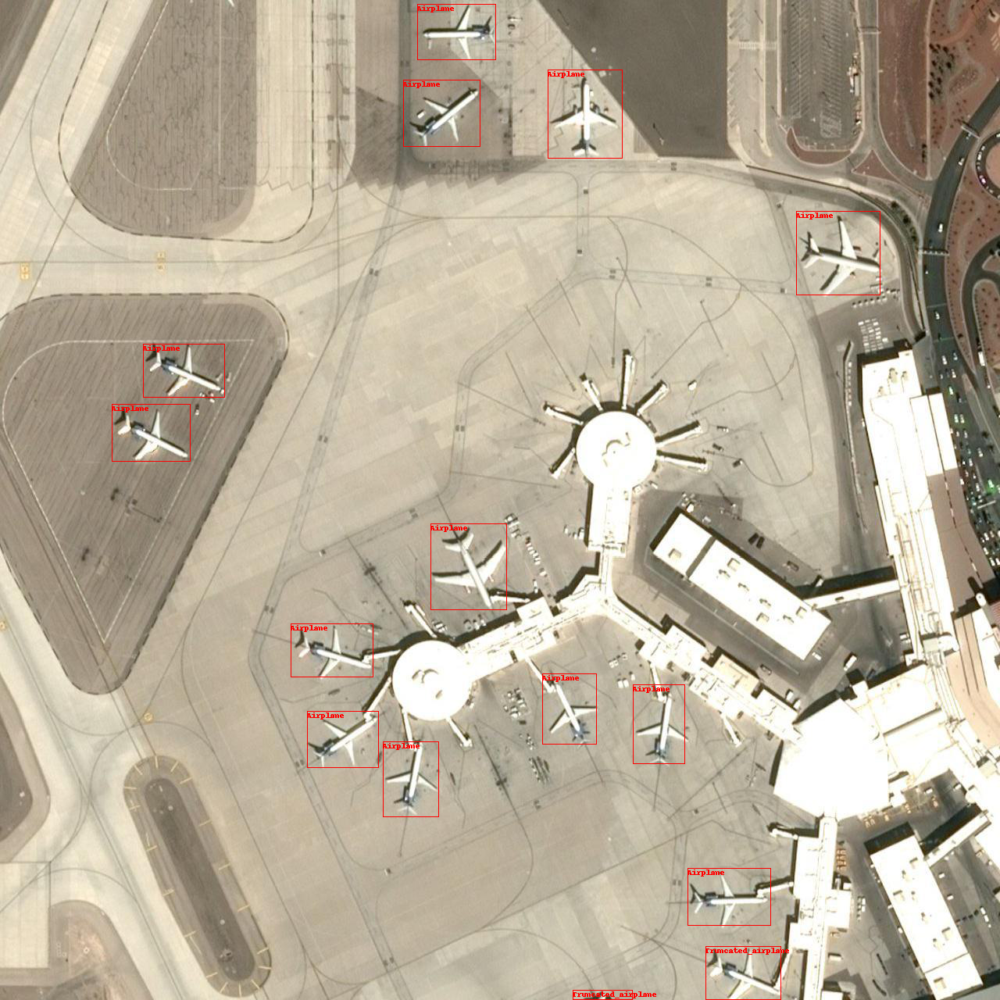

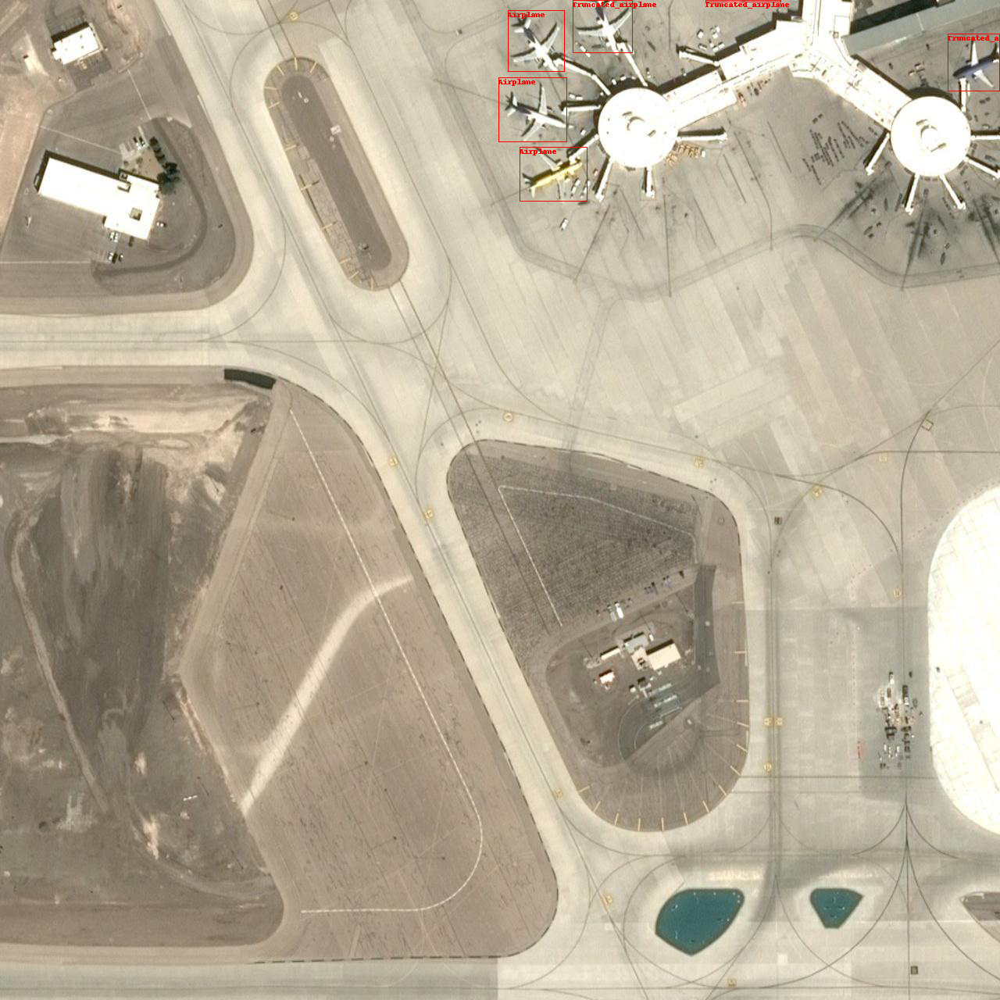

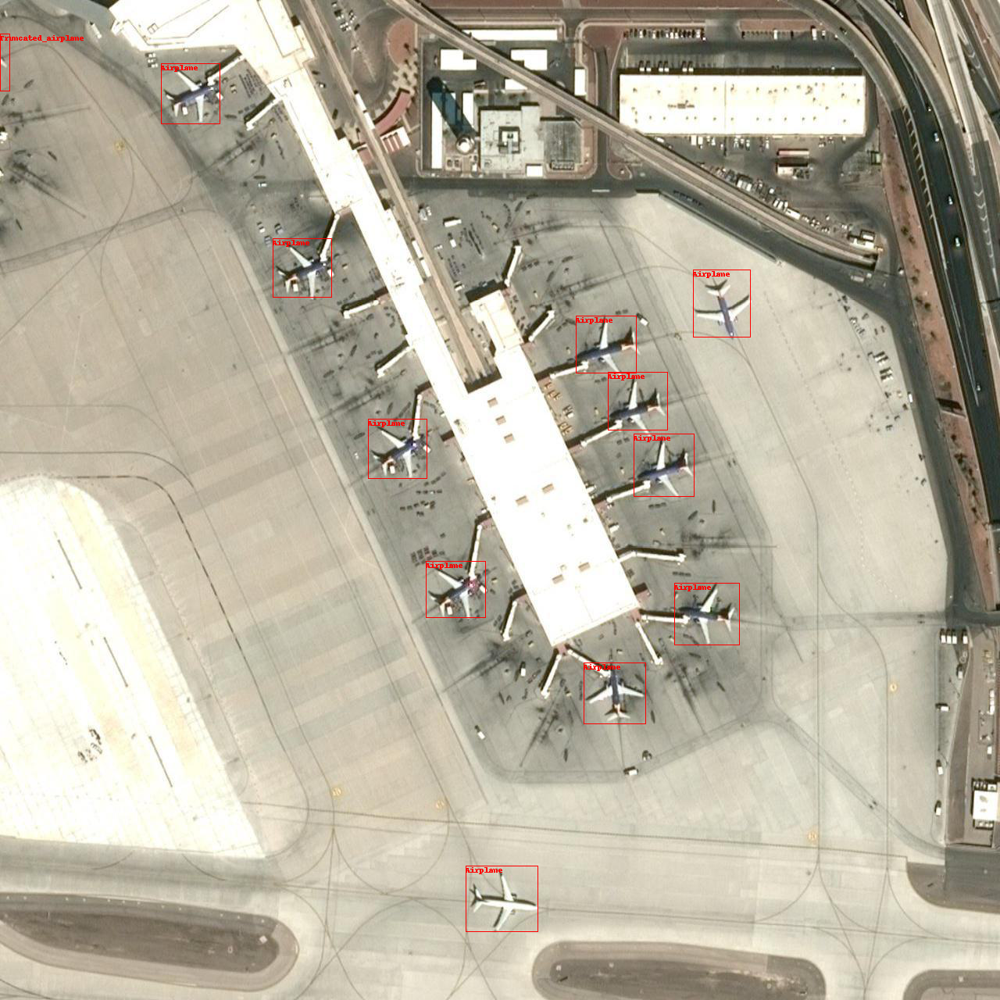

In [78]:
import os.path
import PIL.ImageDraw

imList = ['../sliced_images/quartered/true/074737f4-7f59-4729-be5d-67f6f1d34668_0_0.jpg', 
          '../sliced_images/quartered/true/074737f4-7f59-4729-be5d-67f6f1d34668_1_0.jpg', '../sliced_images/quartered/true/074737f4-7f59-4729-be5d-67f6f1d34668_1_1.jpg']

for pickone in imList:
    
    img = PIL.Image.open(pickone)
    draw = PIL.ImageDraw.Draw(img)

    for k, row in df[df['image_id'] == os.path.basename(pickone)].iterrows():
        draw.polygon(row['geometry'], outline=(255,0,0))
        draw.text(row['geometry'][0], row['class'], fill=(255,0,0))

    display(img)

## 2. Train-Test Split
---
run and save bounding boxes on training images and save training and test images seperate

In [79]:
createBoundingBoxesOnImages = 1


from sklearn.model_selection import GroupShuffleSplit

X = df[["image_id", "geometry", "bounds", "width", "height"]]
y = df[['class']]

gs = GroupShuffleSplit(n_splits=2, test_size=.2, random_state=42)
train_ix, test_ix = next(gs.split(X, y, groups=df.image_id))

X_train = X.loc[train_ix]
y_train = y.loc[train_ix]

X_test = X.loc[test_ix]
y_test = y.loc[test_ix]


In [80]:
if(createBoundingBoxesOnImages == 1):
    for id in X_train["image_id"].unique():
        pickone = '../sliced_images/quartered/true/' + id
        img = PIL.Image.open(pickone)
        #draw = PIL.ImageDraw.Draw(img)
        #for k, row in df[df['image_id'] == id].iterrows():
        #    draw.polygon(row['geometry'], outline=(255,0,0))
        #    draw.text(row['geometry'][0], row['class'], fill=(255,0,0))
        
        img.save('../images/train/' + id)

In [81]:
if(createBoundingBoxesOnImages == 1):
    for id in X_test["image_id"].unique():
        pickone = '../sliced_images/quartered/true/' + id
        img = PIL.Image.open(pickone)
        
        img.save('../images/test/' + id)

In [ ]:
img_list = list('../images/train/*.jpg')
print("Number of Train-images: {}".format(len(img_list)))

## 3. Create XML Files
---

In [82]:
import numpy as np
from pathlib import Path
import xml.etree.cElementTree as ET
from PIL import Image


def create_labimg_xml(image_path, df):

    temp_df = df
    image_path = Path(image_path)
    img = np.array(Image.open(image_path).convert('RGB'))

    annotation = ET.Element('annotation')
    ET.SubElement(annotation, 'folder').text = str(image_path.parent.name)
    ET.SubElement(annotation, 'filename').text = str(image_path.name)
    ET.SubElement(annotation, 'path').text = str(image_path)

    source = ET.SubElement(annotation, 'source')
    ET.SubElement(source, 'database').text = 'Unknown'

    size = ET.SubElement(annotation, 'size')
    ET.SubElement(size, 'width').text = str (img.shape[1])
    ET.SubElement(size, 'height').text = str(img.shape[0])
    ET.SubElement(size, 'depth').text = str(img.shape[2])

    ET.SubElement(annotation, 'segmented').text = '0'

    for index, row in temp_df.iterrows():
        xmin, ymin, xmax, ymax = row["bounds"][0], row["bounds"][1], row["bounds"][2], row["bounds"][3]

        object = ET.SubElement(annotation, 'object')
        ET.SubElement(object, 'pose').text = 'Unspecified'
        if(row["class"] == "Truncated_airplane"):
            ET.SubElement(object, 'name').text = "Airplane"
            ET.SubElement(object, 'truncated').text = '1'
        elif(row["class"] == "Airplane"):
            ET.SubElement(object, 'name').text = "Airplane"
            ET.SubElement(object, 'truncated').text = '0'
        else:
            print("Error")
        ET.SubElement(object, 'difficult').text = '0'

        bndbox = ET.SubElement(object, 'bndbox')
        ET.SubElement(bndbox, 'xmin').text = str(xmin)
        ET.SubElement(bndbox, 'ymin').text = str(ymin)
        ET.SubElement(bndbox, 'xmax').text = str(xmax)
        ET.SubElement(bndbox, 'ymax').text = str(ymax)

    tree = ET.ElementTree(annotation)
    xml_file_name = image_path.parent / (image_path.name.split('.')[0]+'.xml')
    tree.write(xml_file_name)


# --------------------------------------------------------------------------------
# a quadrilateral bounding box(8 points) coordinate example
    

In [83]:
for id in X_train["image_id"].unique():
        image_id = '../images/train/' + id
        df_temp = df[df['image_id'] == id]
        create_labimg_xml(image_id, df_temp)
        
for id in X_test["image_id"].unique():
        image_id = '../images/test/' + id
        df_temp = df[df['image_id'] == id]
        create_labimg_xml(image_id, df_temp)

# Validation
nohup python model_main_tf2.py --model_dir=models/my_efficientdet_d7_coco17_tpu-32/v1 --pipeline_config_path=models/my_efficientdet_d7_coco17_tpu-32/v1/pipeline.config --checkpoint_dir=models/my_efficientdet_d7_coco17_tpu-32/v1 &

## 4. Convert XML to Tensorflow Record
---

### Create train data:
python generate_tfrecord.py -x /Users/lig/git/schule/airbus_aircraft_etection/tensorflow_env/TensorFlow/workspace/training_demo/images/train -l /Users/lig/git/schule/airbus_aircraft_etection/tensorflow_env/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt -o /Users/lig/git/schule/airbus_aircraft_etection/tensorflow_env/TensorFlow/workspace/training_demo/annotations/train.record

### Create test data:
python generate_tfrecord.py -x /Users/lig/git/schule/airbus_aircraft_etection/tensorflow_env/TensorFlow/workspace/training_demo/images/test -l /Users/lig/git/schule/airbus_aircraft_etection/tensorflow_env/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt -o /Users/lig/git/schule/airbus_aircraft_etection/tensorflow_env/TensorFlow/workspace/training_demo/annotations/test.record




python generate_tfrecord.py -x /home/zengerle@ab.ba.ba-ravensburg.de/airplane_detection/TensorFlow/workspace/training_demo/images/test -l /home/zengerle@ab.ba.ba-ravensburg.de/airplane_detection/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt -o /home/zengerle@ab.ba.ba-ravensburg.de/airplane_detection/TensorFlow/workspace/training_demo/annotations/test.record

python generate_tfrecord.py -x /home/zengerle@ab.ba.ba-ravensburg.de/airplane_detection/TensorFlow/workspace/training_demo/images/train -l /home/zengerle@ab.ba.ba-ravensburg.de/airplane_detection/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt -o /home/zengerle@ab.ba.ba-ravensburg.de/airplane_detection/TensorFlow/workspace/training_demo/annotations/train.record


## 5. Train the Model
---
### Navigate to airplane_detection/TensorFlow/workspace/training_demo:

#### Default Training-Script:
python model_main_tf2.py --model_dir=models/my_ssd_resnet50_v1_fpn/v1 --pipeline_config_path=models/my_ssd_resnet50_v1_fpn/v1/pipeline.config &

#### Run Training in Background with Terminal Outputstream
nohup python model_main_tf2.py --model_dir=models/my_ssd_resnet50_v1_fpn/v1 --pipeline_config_path=models/my_ssd_resnet50_v1_fpn/v1/pipeline.config & \
(Access Stream with: tail -f nohup.out)

#### Run Training in Background and save stream to log-file:
nohup python model_main_tf2.py --model_dir=models/my_ssd_resnet50_v1_fpn/v1 --pipeline_config_path=models/my_ssd_resnet50_v1_fpn/v1/pipeline.config --alsologtostderr > /log/my_ssd_resnet50_v1_fpn/v1/train.log 2>&1 & \
(Access Log-File with: tail -f /log/model_main_tf2.log)


#### Note:
wenn die Batch-Size drastisch verringert wird (z.B. 128 -> 2 = Faktor x64) muss auch die Learning-Rate dementsprechend angepasst werden (ansonsten divergiert Loss-Function -> Division durch 0 -> Loss von NaN)

## 6. Evaluate the trained Modell on latest Checkpoints
---
### Navigate to airplane_detection/TensorFlow/workspace/training_demo:


##### Evaluate with the latest Model-Checkpoint:
nohup python model_main_tf2.py --model_dir=models/my_ssd_resnet50_v1_fpn/v1 --pipeline_config_path=models/my_ssd_resnet50_v1_fpn/v1/pipeline.config --checkpoint_dir=models/my_ssd_resnet50_v1_fpn/v1 &

#### Note:
--checkpoint_dir will only execute the evaluation -> no training \
Run parallel / at the same time to the Training e.g. in new terminal to evaluate all the checkpoints over the whole trainings process


## 7. Additional Features:
---
### Navigate to airplane_detection/TensorFlow/workspace/training_demo:


#### Tensorboard - Visualize Training / Evaluation:
Start Tensorboard: \
tensorboard --logdir=models/my_ssd_resnet50_v1_fpn/v1/ &

#### Get nohup-stream:
tail -f nohup.out

#### Get GPU-Info:
nvidia-smi \
watch -n 1 nvidia-smi // live update every second

#### Set available GPUs (GPUs which should be used for the program):
export CUDA_VISIBLE_DEVICES=0 // set device by single indizes \
export CUDA_VISIBLE_DEVICES=3,4,5 // set list of devices \
export CUDA_VISIBLE_DEVICES=0,1,2,3,4,5,6,7 // all devices 

#### Get Task-Manager
top

#### List servers
jobs -l

#### Kill process:
kill "pid"

### TO-DO

#### Hyperparametertuning
Parameter anschauen, in voller Auflösung trainieren 1280x1280

#### Eval-Bilder Predicten und anschauen 

#### Modell-Ergebnisse an UseCase anpassen
Ergebniss bewerten, auf UseCase beziehen, was uns das nun bringt, die Flugzeuge zu erkennen (Anzahl an predicteten Flugzeugen, ...)

#### Ergebnisse visualisieren
Count der Flugzeuge in e.g. Datafrage zu image-id \
Histogram - verteilung der Anzahl an Flugzeugen \
Durchschnitt an Flugzeugen pro Flughafen etc.


#### truncated / abgeschnittene Flugzeuge
auf slices predicten und danach vier slices wieder zu einem Bild zusammenfügen

#### Test - Train Split ändern (z.B. 90 - 10 für mehr Trainingsbilder)

#### Ausblick wie man Ergebnis verbessern kann
mehr Trainingsbilder (Data Augmentation) -> Spiegeln, verzerren, etc.

navigate to (training_demo)

nohup python model_main_tf2.py --model_dir=models/conf_ssd_resnet50_v1_fpn --pipeline_config_path=models/conf_ssd_resnet50_v1_fpn/pipeline.config &


(sollte sehr genau sein dauert aber lange)
nohup python model_main_tf2.py --model_dir=models/my_centernet_hg104_1024x1024_coco17_tpu-32 --pipeline_config_path=models/my_centernet_hg104_1024x1024_coco17_tpu-32/pipeline.config &


(sollte sehr schnell sein ist aber nicht so genau)
nohup python model_main_tf2.py --model_dir=models/my_centernet_mobilenetv2_fpn_od --pipeline_config_path=models/my_centernet_mobilenetv2_fpn_od/pipeline.config &


(sollte sehr genau sein dauert aber lange)
nohup python model_main_tf2.py --model_dir=models/my_efficientdet_d7_coco17_tpu-32 --pipeline_config_path=models/my_efficientdet_d7_coco17_tpu-32/pipeline.config &